<h1> <title> Grouping of cities in Brazil by Covid-19 cases </title> </h1>


The objective of this work is to analyze the situation of different cities in Brazil with respect to their numbers about the Covid-19 pandemic. 

# Section 1: Data manipulation and exploratory analysis

In [1]:
# Importing necessary libraries:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mlb
import seaborn as sns
from datetime import datetime

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [16]:
covidbr = pd.read_excel('https://github.com/marcellongvb/datasciencecapstone/raw/master/covidbrdata2july.xlsx')
covidbr.head()

,regiao,estado,municipio,coduf,codmun,codRegiaoSaude,nomeRegiaoSaude,data,semanaEpi,populacaoTCU2019,casosAcumulado,casosNovos,obitosAcumulado,obitosNovos,Recuperadosnovos,emAcompanhamentoNovos,interior/metropolitana
0,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-25,9,210147125,0,0,0,0,NaN,NaN,NaN
1,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-26,9,210147125,1,1,0,0,NaN,NaN,NaN
2,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-27,9,210147125,1,0,0,0,NaN,NaN,NaN
3,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-28,9,210147125,1,0,0,0,NaN,NaN,NaN
4,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-29,9,210147125,2,1,0,0,NaN,NaN,NaN


Data columns:


*   ```regiao```: Brazilian region;
*   ```estado```: The state of the corresponding data;
*   ```municipio```: City name;
*   ```coduf```:  Code of the state;
*   ```codmun```: Code of the city;
*   ```codRegiaoSaude```: Code of the Health region;
*   ```nomeRegiaoSaude```: Name of the Health region;
*   ```data```: Date;
*   ```semanaEpi```: Number of the week;
*   ```populacaoTCU2019```: Population number, according to IBGE (available to TCU), in 2019
*   ```casosAcumulado```: Number of accumulated cases;
*   ```casosNovos```: Number of new cases;
*   ```obitosAcumulado ```: Number of accumulated deaths;
*   ```obitosNovos```: Number of new deaths;
*   ```RecuperadosNovos```: Number of recoveries;
*   ```emAcompanhamentoNovos```: Number of new followed-up cases;
*   ```interior/metropolitana```: Whether the city is from metropolitan or rural area 



In [17]:
covidbr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522922 entries, 0 to 522921
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   regiao                  522922 non-null  object        
 1   estado                  522794 non-null  object        
 2   municipio               517301 non-null  object        
 3   coduf                   522922 non-null  int64         
 4   codmun                  519338 non-null  float64       
 5   codRegiaoSaude          517301 non-null  float64       
 6   nomeRegiaoSaude         517301 non-null  object        
 7   data                    522922 non-null  datetime64[ns]
 8   semanaEpi               522922 non-null  int64         
 9   populacaoTCU2019        520885 non-null  object        
 10  casosAcumulado          522922 non-null  int64         
 11  casosNovos              522922 non-null  int64         
 12  obitosAcumulado         522922

Verifying if there is a relevant amount of missing data in the dataframe:

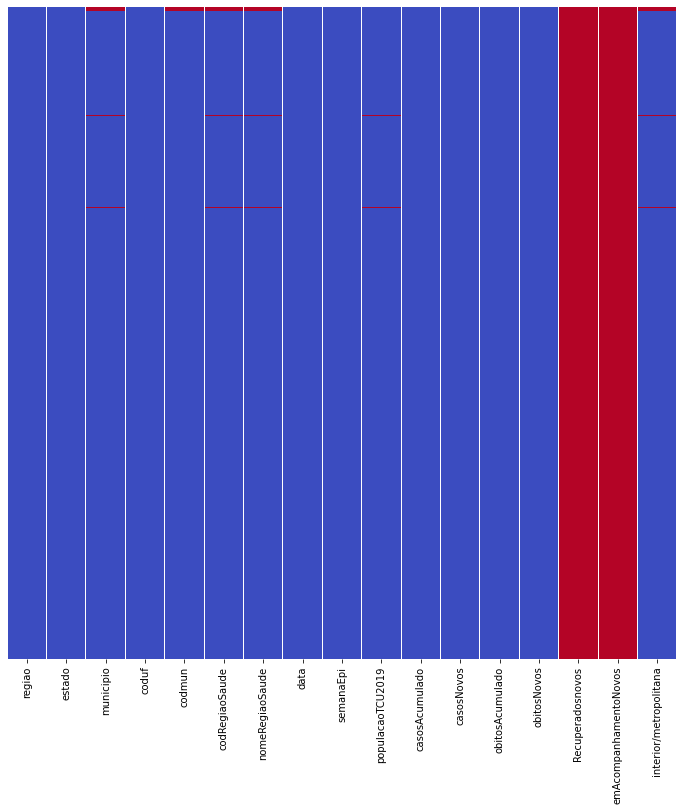

In [18]:
plt.figure(figsize=(12,12))
sns.heatmap(covidbr.isnull(),yticklabels=False,cbar=False,cmap='coolwarm')

The above map shows that columns ```RecuperadosNovos``` and ```emAcompanhamentoNovos``` are empty columns. Let's remove these columns and translate the columns' names.

## Data setting

In [19]:
# Removing unnecessary columns
covidbr.drop(labels = ['Recuperadosnovos','emAcompanhamentoNovos'], axis = 1, inplace = True)

In [20]:
# Renaming columns:
new_columns = ['Region','State','City','UF code','City code' ,'Health Region Code','Health Region Name','Date', 'Week', 'Population', 'Accumulated Cases', 'New Cases', 'Accumulated Deaths', 'New Deaths', 'Rural/Metropolitan']
trans = {}

for i in range(len(covidbr.columns)):
    trans[covidbr.columns[i]] = new_columns[i]
    
covidbr.rename(columns = trans, inplace = True )

In [21]:
covidbr.head()

,Region,State,City,UF code,City code,Health Region Code,Health Region Name,Date,Week,Population,Accumulated Cases,New Cases,Accumulated Deaths,New Deaths,Rural/Metropolitan
0,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-25,9,210147125,0,0,0,0,NaN
1,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-26,9,210147125,1,1,0,0,NaN
2,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-27,9,210147125,1,0,0,0,NaN
3,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-28,9,210147125,1,0,0,0,NaN
4,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-29,9,210147125,2,1,0,0,NaN


To do the analysis, I want the numbers/100,000 inhabitants. Let's treat the column ```Population```.

In [22]:
# # Uncomment this cell to verify that the population number cannot be set as integer
# covidbr['Population'].astype(int)

There are some empty values in this column. Let's work with non-empty columns.

In [23]:
# # Uncomment this cell to verify that the population number still cannot be set as integer
# covidbr[~covidbr['Population'].isnull()]['Population'].astype(int)

Some entrances have numbers in parenthesis and dots. I assume that the number in parenthesis has no meaning to remove them. The dots have the same meaning as a coma in american numbers' system, so I also remove them.

In [24]:
# Removing the numbers in parenthesis of some entrances
population_treated = covidbr[~covidbr['Population'].isnull()]['Population'].apply(lambda x: x.split('(')[0]).str.replace('.','').astype(int, copy=False)
covidbr.drop(labels='Population', axis=1, inplace = True)
covidbr['Population'] = population_treated
covidbr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522922 entries, 0 to 522921
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Region              522922 non-null  object        
 1   State               522794 non-null  object        
 2   City                517301 non-null  object        
 3   UF code             522922 non-null  int64         
 4   City code           519338 non-null  float64       
 5   Health Region Code  517301 non-null  float64       
 6   Health Region Name  517301 non-null  object        
 7   Date                522922 non-null  datetime64[ns]
 8   Week                522922 non-null  int64         
 9   Accumulated Cases   522922 non-null  int64         
 10  New Cases           522922 non-null  int64         
 11  Accumulated Deaths  522922 non-null  int64         
 12  New Deaths          522922 non-null  int64         
 13  Rural/Metropolitan  517301 no

In [25]:
covidbr.head()

,Region,State,City,UF code,City code,Health Region Code,Health Region Name,Date,Week,Accumulated Cases,New Cases,Accumulated Deaths,New Deaths,Rural/Metropolitan,Population
0,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-25,9,0,0,0,0,NaN,210147125.0
1,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-26,9,1,1,0,0,NaN,210147125.0
2,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-27,9,1,0,0,0,NaN,210147125.0
3,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-28,9,1,0,0,0,NaN,210147125.0
4,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-29,9,2,1,0,0,NaN,210147125.0


Now, the column ```Population``` is filled with data as float. This is because there are NaNs in the column, the other values are integers, and are the ones we use.

Some of the data is not associated to any specific state. I split the data into individual dataframes for each region, without considering the data not associated with any specific state.

<b> Brazilian regions: </b> <br>
Nordeste: Northeast <br>
Norte: North <br>
Centro-oeste: Midwest <br>
Sudeste: Southeast <br>
Sul: South <br>

Verifying the number of cities in the data:

In [26]:
uniquecities = covidbr['City'].unique()
uniquecitycodes = covidbr['City code'].unique()

In [27]:
print(' Unique city names in the data:', len(uniquecities), '\n', 'Unique city codes in the data:', len(uniquecitycodes))

 Unique city names in the data: 5073 
 Unique city codes in the data: 5355


There are more city codes in the data than city names. Assuming that that some of the city names are missing, let's try to recover the name of such cities.

In [28]:
# The following dataframe is a sub-dataframe where City column is empty. I want to check what are the city codes present in data 
# where city name is not filled 
n_empty_citycodes = covidbr[covidbr['City'].isnull()]
n_empty_citycodes = n_empty_citycodes[~n_empty_citycodes['City code'].isnull()]

In [29]:
n_empty_citycodes['City code'].unique()

array([110000., 140000., 170000., 210000., 220000., 230000., 240000.,
       250000., 260000., 270000., 280000., 290000., 310000., 320000.,
       330000., 350000., 410000., 420000., 430000., 510000., 520000.])

The above city codes do not correspond to specific cities, but to their states. It is possible to verify this information in the link https://www.ibge.gov.br/explica/codigos-dos-municipios.php#RO

The number of city codes with missing city name is very small. Therefore, it does not represent the difference between the number of city codes and the number of city names. This difference may be due to different cities having the same name, but in different states. Before investigating that, let's check if there is any data where city name is present, but the city code is not.

In [30]:
# Checking if there is any non-empty city name on data where city code is empty

n_empty_citynames = covidbr[covidbr['City code'].isnull()]
n_empty_citynames = n_empty_citynames[~n_empty_citynames['City'].isnull()]
n_empty_citynames

,Region,State,City,UF code,City code,Health Region Code,Health Region Name,Date,Week,Accumulated Cases,New Cases,Accumulated Deaths,New Deaths,Rural/Metropolitan,Population


Therefore, there is no data with city name and without city code. Let's verify multiple occurences of city names in the data.

In [31]:
codes_names = covidbr[['City', 'City code']]
multiple_codes_cities = {}
for i in range(len(uniquecities)):
    codes_per_city =  codes_names[codes_names['City'] == uniquecities[i]]['City code'].unique()
    if len(codes_per_city) > 1:
        multiple_codes_cities[uniquecities[i]] = codes_per_city

list(multiple_codes_cities)[:20]

['Presidente Médici',
 'Alto Paraíso',
 'Buritis',
 'Nova União',
 'Cruzeiro do Sul',
 'Rio Branco',
 'Humaitá',
 'Itapiranga',
 'Japurá',
 'Tabatinga',
 'Alto Alegre',
 'Boa Vista',
 'Bonfim',
 'Iracema',
 'Belém',
 'Bom Jesus do Tocantins',
 'Bonito',
 'Capanema',
 'Monte Alegre',
 "Pau D'Arco"]

Some cities have more than one city code. Let's do one last test, to verify if any of these city names have a number of occurences in multiple states different to the number of city codes for each city.

In [ ]:
# Checking if the number of city codes is different of the number of states for each city name
wrong_cities = []
for i in range(len(multiple_codes_cities.keys())):
    x = covidbr[covidbr['City'] == list(multiple_codes_cities.keys())[i]]['State'].nunique()
    y = len(multiple_codes_cities[list(multiple_codes_cities.keys())[i]])
    if x != y:
        wrong_cities.extend([list(multiple_codes_cities.keys())[i]])
wrong_cities

[]

The above test shows that there is no city name with wrong number of occurences. For beginning the work with this data, we substitute the columns numbers by the numbers/100.000 inhabitants. First, let's verify if there are any data without population number, but with city name.

In [ ]:
import math
cities_test = covidbr[covidbr['Population'].isnull()]['City']

for city in covidbr[covidbr['Population'].isnull()]['City']:
    if math.isnan(city) == False:
        print(city)

There is no row in the dataframe with empty population number and non-empty city name. As we will only work with data where both fields are non-empty, I substitute the whole dataframe by the subset where population field is non-empty.

In [32]:
covidbr = covidbr[~covidbr['Population'].isnull()]

In [33]:
covidbr['Population'].astype(int, copy = False)

0         210147125
1         210147125
2         210147125
3         210147125
4         210147125
            ...    
522917      3015268
522918      3015268
522919      3015268
522920      3015268
522921      3015268
Name: Population, Length: 520885, dtype: int64

Substituting the columns ```Accumulated Cases```, ```Accumulated Deaths```, ```New Cases``` and ```New Deaths``` by numbers/100,000 inhabitants.

In [34]:
covidbr['Accumulated Cases'] = (covidbr['Accumulated Cases']/covidbr['Population'])*100000
covidbr['Accumulated Deaths'] = (covidbr['Accumulated Deaths']/covidbr['Population'])*100000
covidbr['New Cases'] = (covidbr['New Cases']/covidbr['Population'])*100000
covidbr['New Deaths'] = (covidbr['New Deaths']/covidbr['Population'])*100000

In [35]:
covidbr.head()

,Region,State,City,UF code,City code,Health Region Code,Health Region Name,Date,Week,Accumulated Cases,New Cases,Accumulated Deaths,New Deaths,Rural/Metropolitan,Population
0,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-25,9,0.000000,0.000000,0.0,0.0,NaN,210147125.0
1,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-26,9,0.000476,0.000476,0.0,0.0,NaN,210147125.0
2,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-27,9,0.000476,0.000000,0.0,0.0,NaN,210147125.0
3,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-28,9,0.000476,0.000000,0.0,0.0,NaN,210147125.0
4,Brasil,NaN,NaN,76,NaN,NaN,NaN,2020-02-29,9,0.000952,0.000476,0.0,0.0,NaN,210147125.0


Let's add a column to the dataframe with city name and state, then creating different dataframes for each region.

In [36]:
# Adding column of city and state to the data

covidbr['City, State'] = covidbr['City'] + ', ' + covidbr['State']

# Creating smaller dataframes for each Region
northeast = covidbr[covidbr['Region'] == 'Nordeste']
southeast = covidbr[covidbr['Region'] == 'Sudeste']
south = covidbr[covidbr['Region'] == 'Sul']
north = covidbr[covidbr['Region'] == 'Norte']
midwest = covidbr[covidbr['Region'] == 'Centro-Oeste']
# brasil = covidbr[covidbr['Region'] == 'Brasil']

# List of dates
dates = sorted(list(covidbr['Date'].dt.strftime('%m/%d/%Y').unique()))

# Lists of cities in each region
northeast_cities = sorted(list(northeast[~northeast['City, State'].isnull()]['City, State'].unique()))
north_cities = sorted(list(north[~north['City, State'].isnull()]['City, State'].unique()))
midwest_cities = sorted(list(midwest[~midwest['City, State'].isnull()]['City, State'].unique()))
southeast_cities = sorted(list(southeast[~southeast['City, State'].isnull()]['City, State'].unique()))
south_cities = sorted(list(south[~south['City, State'].isnull()]['City, State'].unique()))

Let's plot some graphs of the numbers for each region. 

## Accumulated number of cases

In [37]:
northeast_temp = northeast.groupby('Date').sum()['Accumulated Cases']
north_temp = north.groupby('Date').sum()['Accumulated Cases']
midwest_temp = midwest.groupby('Date').sum()['Accumulated Cases']
southeast_temp = southeast.groupby('Date').sum()['Accumulated Cases']
south_temp = south.groupby('Date').sum()['Accumulated Cases']

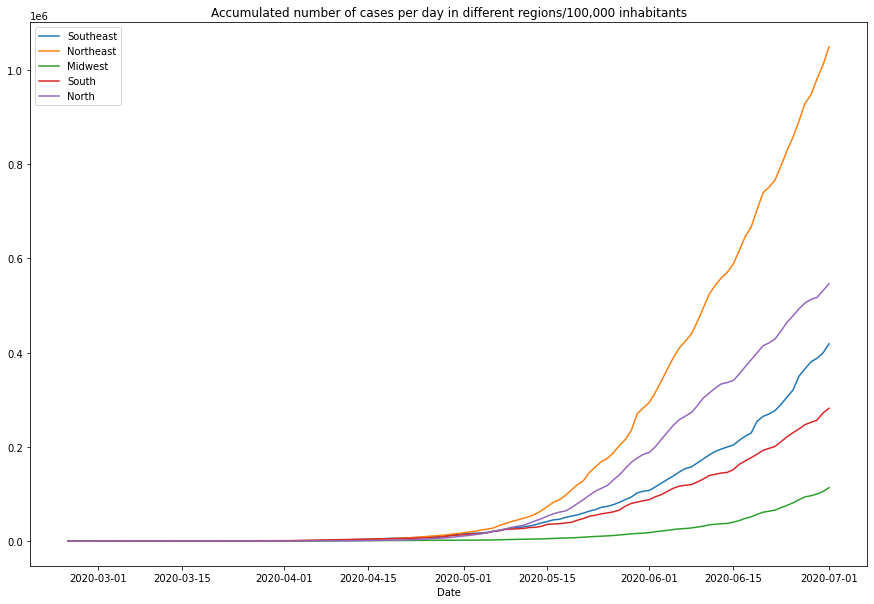

In [38]:
# Plotting graphic of Accumulated cases per region

plt.figure(figsize=(15,10))
ax = sns.lineplot(x = southeast_temp.index, y = southeast_temp.values, label = 'Southeast')
sns.lineplot(x = northeast_temp.index, y = northeast_temp.values, label = 'Northeast', axes = ax)
sns.lineplot(x = midwest_temp.index, y = midwest_temp.values, label =  'Midwest', axes = ax)
sns.lineplot(x = south_temp.index, y = south_temp.values, label = 'South' ,axes = ax)
sns.lineplot(x = north_temp.index, y = north_temp.values, label = 'North' , axes = ax)
plt.title('Accumulated number of cases per day in different regions/100,000 inhabitants')
plt.legend()
# plt.xticks(covidbr['Date'])

The accumulated number of cases is worse in the Northeast region, followed by the North region. Even though the cities with greater absolute number of cases are concentrated in the southeast region, northeast and north have the worse number of cases/100,000 inhabitants.

## New Cases

In [39]:
northeast_temp = northeast.groupby('Date').sum()['New Cases']
north_temp = north.groupby('Date').sum()['New Cases']
midwest_temp = midwest.groupby('Date').sum()['New Cases']
southeast_temp = southeast.groupby('Date').sum()['New Cases']
south_temp = south.groupby('Date').sum()['New Cases']

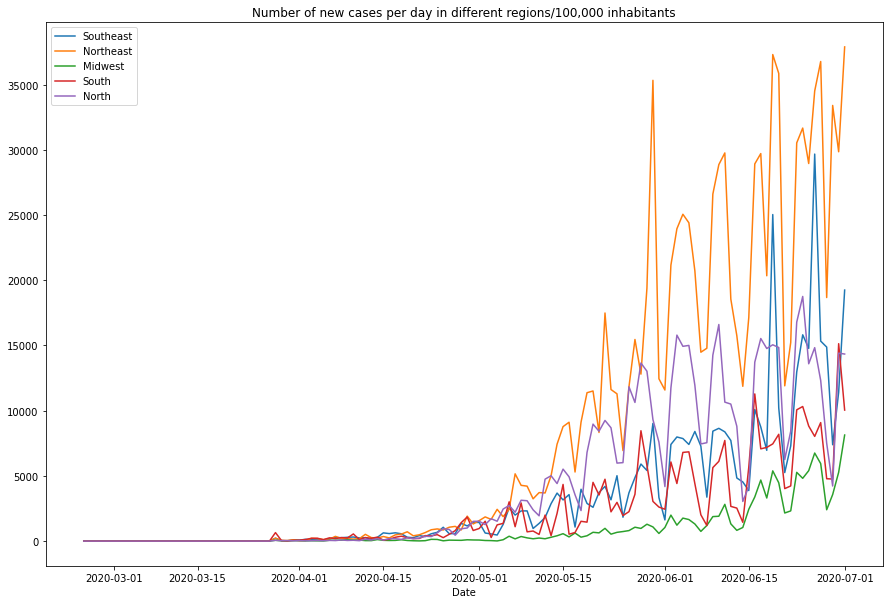

In [40]:
# Plotting graphic of new cases per region

# later configure x axis: https://matplotlib.org/3.1.1/api/dates_api.html , https://matplotlib.org/3.1.1/gallery/text_labels_and_annotations/date.html

plt.figure(figsize=(15,10))
ax = sns.lineplot(x = southeast_temp.index, y = southeast_temp.values, label = 'Southeast')
sns.lineplot(x = northeast_temp.index, y = northeast_temp.values, label = 'Northeast', axes = ax)
sns.lineplot(x = midwest_temp.index, y = midwest_temp.values, label =  'Midwest', axes = ax)
sns.lineplot(x = south_temp.index, y = south_temp.values, label = 'South' ,axes = ax)
sns.lineplot(x = north_temp.index, y = north_temp.values, label = 'North' , axes = ax)
plt.title('Number of new cases per day in different regions/100,000 inhabitants')
plt.legend()

## Accumulated deaths

In [41]:
northeast_temp = northeast.groupby('Date').sum()['Accumulated Deaths']
north_temp = north.groupby('Date').sum()['Accumulated Deaths']
midwest_temp = midwest.groupby('Date').sum()['Accumulated Deaths']
southeast_temp = southeast.groupby('Date').sum()['Accumulated Deaths']
south_temp = south.groupby('Date').sum()['Accumulated Deaths']

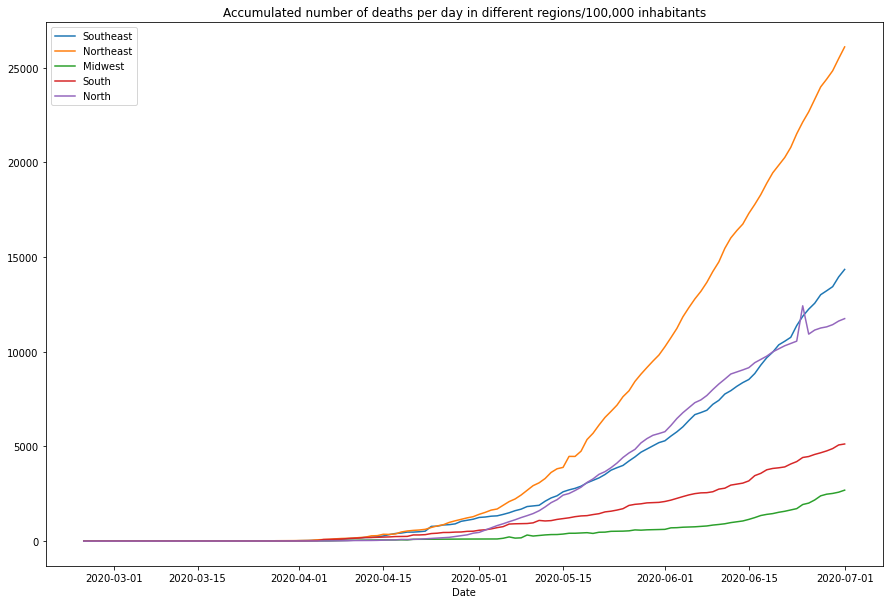

In [42]:
# Plotting graphic of accumulated deaths per region

plt.figure(figsize=(15,10))
ax = sns.lineplot(x = southeast_temp.index, y = southeast_temp.values, label = 'Southeast')
sns.lineplot(x = northeast_temp.index, y = northeast_temp.values, label = 'Northeast', axes = ax)
sns.lineplot(x = midwest_temp.index, y = midwest_temp.values, label =  'Midwest', axes = ax)
sns.lineplot(x = south_temp.index, y = south_temp.values, label = 'South' ,axes = ax)
sns.lineplot(x = north_temp.index, y = north_temp.values, label = 'North' , axes = ax)
plt.title('Accumulated number of deaths per day in different regions/100,000 inhabitants')
plt.legend()

There is one point in the North's curve that seems problematic because it makes the curve not to be always ascending, but I ignore that for further treatment.

## New Deaths

In [43]:
northeast_temp = northeast.groupby('Date').sum()['New Deaths']
north_temp = north.groupby('Date').sum()['New Deaths']
midwest_temp = midwest.groupby('Date').sum()['New Deaths']
southeast_temp = southeast.groupby('Date').sum()['New Deaths']
south_temp = south.groupby('Date').sum()['New Deaths']

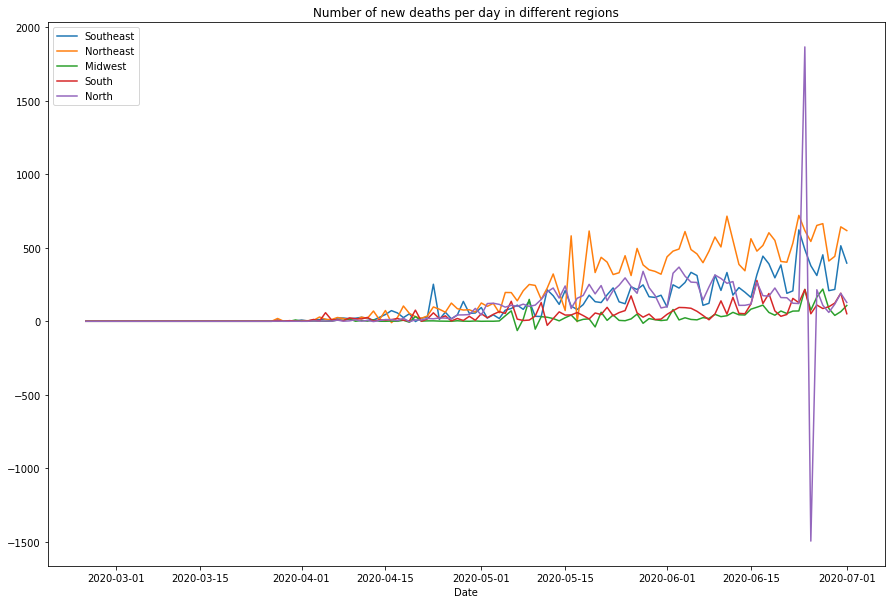

In [44]:
# Plotting graphic of new deaths per region

# later configure x axis: https://matplotlib.org/3.1.1/api/dates_api.html , https://matplotlib.org/3.1.1/gallery/text_labels_and_annotations/date.html

plt.figure(figsize=(15,10))
ax = sns.lineplot(x = southeast_temp.index, y = southeast_temp.values, label = 'Southeast')
sns.lineplot(x = northeast_temp.index, y = northeast_temp.values, label = 'Northeast', axes = ax)
sns.lineplot(x = midwest_temp.index, y = midwest_temp.values, label =  'Midwest', axes = ax)
sns.lineplot(x = south_temp.index, y = south_temp.values, label = 'South' ,axes = ax)
sns.lineplot(x = north_temp.index, y = north_temp.values, label = 'North' , axes = ax)
plt.title('Number of new deaths per day in different regions')
plt.legend()

The number of new cases and new deaths oscilates a lot, but follows an ascending trend for every region. The less grave situations are of the south and midwest regions. This property can be seen in every plotted graph. 

The graphic above shows that the number of new deaths has wrong entries, as it is negative for some dates in some regions. The number of new cases and new deaths are not used in further analysis, so we ignore this problem.

# Section 2: Individual dataframes for each region

Let's construct one dataframe per region, where cities are rows and dates are columns. First, let's verify the number of cities in each region:

In [45]:
print(' Number of cities in each region:', '\n', 'Nordeste:', northeast[~northeast['City, State'].isnull()]['City, State'].nunique(), '\n',
      'Norte:',north[~north['City, State'].isnull()]['City, State'].nunique(), '\n', 
      'Centro-Oeste:',midwest[~midwest['City, State'].isnull()]['City, State'].nunique(), '\n',
      'Sudeste:',southeast[~southeast['City, State'].isnull()]['City, State'].nunique(), '\n',
      'Sul:', south[~south['City, State'].isnull()]['City, State'].nunique())

 Number of cities in each region: 
 Nordeste: 1759 
 Norte: 434 
 Centro-Oeste: 424 
 Sudeste: 1649 
 Sul: 1067


The number of cities in each region do not correspond to the real number of cities. The correct number of cities in each region can be verified in the following link: https://bit.ly/2Y4jYz5 in the table *Quantidade por região*.

The original data has some of the entries lacking the corresponding cities or probably because there are no registered number of cases in those cities. I deal only with the cities explicitly presented in the data.

In [46]:
# The following function creates a dataframe where rows are cities and columns are dates. 
# This algorithm is sensitive to cities with different health regions
# Inputs: df1 - DataFrame containing cities, dates and number of interest (accumulated cases, deaths, new cases, deaths...)
#         cities - list of cities
#         numcol - String with name of column relative to the number of interest.
def citydaily_num(region, cities, numcol):
    # The number of runs correspond to number of times a dataframe of 200 rows will be constructed from the data, as it rises 
    # the efficiency of the routine 
    runs = int(len(cities)/200)
    # integer returns a boolean that says if the number of cities in the region correspond to an integer number multiple of 200
    integer = len(cities)/200 == int(len(cities)/200)
    for h in range(0,runs):
        # If a city has more than one health region, this routine also deals with it
        health_regions = region[region['City, State'] == cities[200*h]]['Health Region Name'].value_counts()
        if len(health_regions) > 1:
            number_section = region[region['City, State']   == cities[200*h]]
            number_section = number_section[number_section['Health Region Name'] == health_regions.index[0]][['Date',numcol]].set_index('Date')
            number_section.rename(columns = {numcol: cities[200*h] +  '(' + health_regions.index[0] + ')'}, inplace = True)
            for i in range(1,len(health_regions)):
                next_region = region[region['City, State']   == cities[200*h]]
                next_region = next_region[next_region['Health Region Name'] == health_regions.index[i]][['Date', numcol]].set_index('Date')
                next_region.rename(columns = {numcol: cities[200*h] + ' (' + health_regions.index[i] + ')'}, inplace = True)
                number_section = number_section.join(next_region, how = 'outer')
        else:
            number_section = region[region['City, State'] == cities[200*h]][['Date', numcol]].set_index('Date')
            number_section.rename(columns = {numcol: cities[200*h]}, inplace = True)

        for i in range(1,200):
            health_regions = region[region['City, State'] == cities[200*h + i]]['Health Region Name'].value_counts()
            if len(health_regions) > 1:
                first_region = region[region['City, State']   == cities[200*h + i]]
                first_region = first_region[first_region['Health Region Name'] == health_regions.index[0]][['Date',numcol]].set_index('Date')
                first_region.rename(columns = {numcol: cities[200*h + i] + ' (' + health_regions.index[0] + ')'}, inplace = True)
                number_section = number_section.join(first_region, how = 'outer')
                for j in range(1,len(health_regions)):
                    next_region = region[region['City, State']   == cities[200*h + i]]
                    next_region = next_region[next_region['Health Region Name'] == health_regions.index[j]][['Date',numcol]].set_index('Date')
                    next_region.rename(columns = {numcol: cities[200*h + i] + ' (' + health_regions.index[j] + ')'}, inplace = True)
                    number_section = number_section.join(next_region, how = 'outer')
            else:
                next_city = region[region['City, State']   == cities[200*h + i]][['Date',numcol]].set_index('Date')
                next_city.rename(columns = {numcol: cities[200*h + i]}, inplace = True)
                number_section = number_section.join(next_city, how = 'outer')
        if h == 0:
            number = number_section
        else:
            number = number.join(number_section, how = 'outer')

#   If number of cities is not an integer multiple of 200, the following statement deals with the remaining cities
    if ~integer:
        rest = len(cities) - int(len(cities)/200)*200        
        health_regions = region[region['City, State'] == cities[200*runs]]['Health Region Name'].value_counts()
        if len(health_regions) > 1:
            number_section = region[region['City, State']   == cities[200*runs]]
            number_section = number_section[number_section['Health Region Name'] == health_regions.index[0]][['Date',numcol]].set_index('Date')
            number_section.rename(columns = {numcol: cities[200*runs] +  '(' + health_regions.index[0] + ')'}, inplace = True)
            for i in range(1,len(health_regions)):
                next_region = region[region['City, State']   == cities[200*runs]]
                next_region = next_region[next_region['Health Region Name'] == health_regions.index[i]][['Date', numcol]].set_index('Date')
                next_region.rename(columns = {numcol: cities[200*runs] + ' (' + health_regions.index[i] + ')'}, inplace = True)
                number_section = number_section.join(next_region, how = 'outer')
        else:
            number_section = region[region['City, State'] == cities[200*runs]][['Date', numcol]].set_index('Date')
            number_section.rename(columns = {numcol: cities[200*runs]}, inplace = True)

        for i in range(1,rest):
            health_regions = region[region['City, State'] == cities[200*runs + i]]['Health Region Name'].value_counts()
            if len(health_regions) > 1:
                first_region = region[region['City, State']   == cities[200*runs + i]]
                first_region = first_region[first_region['Health Region Name'] == health_regions.index[0]][['Date',numcol]].set_index('Date')
                first_region.rename(columns = {numcol: cities[200*runs + i] + ' (' + health_regions.index[0] + ')'}, inplace = True)
                number_section = number_section.join(first_region, how = 'outer')
                for j in range(1,len(health_regions)):
                    next_region = region[region['City, State']   == cities[200*runs + i]]
                    next_region = next_region[next_region['Health Region Name'] == health_regions.index[j]][['Date',numcol]].set_index('Date')
                    next_region.rename(columns = {numcol: cities[200*runs + i] + ' (' + health_regions.index[j] + ')'}, inplace = True)
                    number_section = number_section.join(next_region, how = 'outer')
            else:
                next_city = region[region['City, State']   == cities[200*runs + i]][['Date',numcol]].set_index('Date')
                next_city.rename(columns = {numcol: cities[200*runs + i]}, inplace = True)
                number_section = number_section.join(next_city, how = 'outer')
    number = number.join(number_section, how = 'outer')
    # Adjusting final settings of resulting dataframe 
    number.reset_index(inplace = True)
    number.sort_values(by='Date', axis=0, inplace = True)
    number['Date'] = number['Date'].dt.strftime('%m/%d/%Y')
    number.set_index('Date', inplace=True)
    number = number.transpose()
    return number

The function ```citydaily_num``` may take a few minutes to construct the dataframe. Let's create one dictionary for each number of accumulated cases and accumulated deaths where the key is a region, and the value is the dataframe constructed using the ```citydaily_num``` function. The numbers of new cases and new deaths are not being used, as they oscillate a lot and this may lead to clustering with irrelevant meaning. 

## Dataframes of accumulated cases

In [47]:
accumulated_cases = {}
accumulated_cases['Northeast'] = citydaily_num(northeast, northeast_cities, 'Accumulated Cases')
accumulated_cases['Northeast'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abaiara, CE",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.520065,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.520065,8.520065,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,25.560194,25.560194,51.120389,51.120389,51.120389,51.120389,51.120389,51.120389,51.120389,59.640453,59.640453,59.640453,59.640453,59.640453,102.240777,102.240777,102.240777,102.240777,110.760842,119.280907,127.800971,127.800971,127.800971,144.841101,144.841101,144.841101,144.841101,144.841101,144.841101,153.361166,153.361166,153.361166,170.401295
"Abaré, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.978592,4.978592,4.978592,4.978592,4.978592,4.978592,4.978592,9.957184,9.957184,9.957184,9.957184,9.957184
"Abaíra, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.000,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,11.442957,45.771827,45.771827,...,57.214784,57.214784,57.214784,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,45.771827,57.214784,57.214784,57.214784,57.214784,57.214784,57.214784,57.214784,57.214784,57.214784,68.657741,68.657741,68.657741,68.657741,80.100698,80.100698,80.100698,57.214784
"Abreu e Lima, PE",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.0001,1.0001,5.0005,10.001,13.001300,15.001500,15.001500,17.001700,18.001800,21.002100,27.002700,29.002900,29.002900,31.003100,36.003600,36.003600,46.004600,49.004900,54.005401,62.006201,67.006701,72.007201,77.007701,83.008301,87.008701,87.008701,91.009101,...,265.026503,271.027103,280.028003,285.028503,287.028703,296.029603,313.031303,319.031903,329.032903,332.033203,338.033803,347.034703,355.035504,361.036104,372.037204,381.038104,384.038404,388.038804,394.039404,402.040204,409.040904,415.041504,418.041804,421.042104,429.042904,430.043004,435.043504,441.044104,443.044304,449.044904,454.045405,454.045405,458.045805,462.046205,464.046405,474.047405,477.047705,478.047805,477.047705,481.048105
"Acajutiba, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.596741,6.596741,6.596741,6.5967

In [48]:
accumulated_cases['North'] = citydaily_num(north, north_cities, 'Accumulated Cases')
accumulated_cases['North'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abaetetuba, PA",0.0,0.0,0.000000,0.000000,0.634123,0.634123,0.634123,0.634123,0.634123,0.634123,0.634123,0.634123,1.268247,1.268247,1.268247,1.268247,1.268247,1.268247,1.902370,1.902370,1.902370,1.902370,3.804741,3.804741,3.804741,3.804741,3.804741,3.804741,3.804741,5.707111,7.609481,7.609481,11.414222,13.950716,16.487210,22.194321,22.194321,28.535555,30.437926,36.779160,...,324.671207,326.573577,341.792540,709.584142,911.869523,972.111251,984.159596,986.696090,987.330213,987.964337,1003.817423,1024.109374,1046.937818,1082.448731,1084.351101,1084.351101,1095.131200,1100.204188,1102.740682,1140.788089,1251.125569,1317.074408,1317.074408,1303.123692,1306.294309,1382.389124,1383.657370,1384.925617,1395.705716,1400.144580,1400.778704,1410.290555,1415.997666,1422.973024,1440.094358,1443.264975,1445.167345,1445.167345,1464.191049,1468.629913
"Abel Figueiredo, PA",0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,40.355125,40.355125,40.355125,53.806833,80.710250,107.613667,242.130751,242.130751,242.130751,242.130751,269.034167,269.034167,403.551251,403.551251,417.002959,417.002959,417.002959,524.616626,591.875168,591.875168,659.133710,659.133710,659.133710,672.585418,712.940543,726.392252,780.199085,807.102502,807.102502,807.102502,807.102502,820.554210,834.005919,834.005919,834.005919,860.909335,928.167877,928.167877,928.167877,941.619586
"Abreulândia, TO",0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,77.549438,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,116.324157,155.098876,155.098876,155.098876,155.098876,155.098876
"Acará, PA",0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,1.798852,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,3.597705,...,46.770161,48.569013,53.965570,53.965570,53.965570,53.965570,53.965570,53.965570,57.563275,57.563275,57.563275,73.752946,320.195715,323.793420,323.793420,323.793420,348.977352,357.971614,361.569319,361.569319,379.557842,393.948661,393.948661,395.747513,404.741775,419.132593,447.914231,449.713083

In [49]:
accumulated_cases['Midwest'] = citydaily_num(midwest,midwest_cities,'Accumulated Cases')
accumulated_cases['Midwest'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abadia de Goiás, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,56.993047,56.993047,68.391656,68.391656,68.391656,68.391656,68.391656,68.391656,68.391656,79.790266,79.790266,91.188875,91.188875,79.790266,79.790266,79.790266,102.587484,102.587484,125.384703,136.783312,159.580531,159.580531,159.580531,193.776359,227.972187,250.769406,239.370797,250.769406,250.769406,250.769406,250.769406,319.161062,319.161062,353.356890,376.154109,376.154109,376.154109,364.755500,433.147156,478.741594
"Abadiânia, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.979044,9.979044,9.979044,9.979044,39.916176,39.916176,49.895220,59.874264,59.874264,59.874264,59.874264,69.853308,69.853308,69.853308,69.853308,89.811396,89.811396,94.800918,114.759006,129.727572,144.696138,144.696138,149.685660,149.685660,154.675182,169.643748,169.643748,174.633270,184.612314,184.612314,184.612314,199.580880,209.559924,229.518012
"Acorizal, MT",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,55.565846,74.087794,74.087794,74.087794,74.087794,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,166.697537,222.263382,222.263382,222.263382,240.785331,240.785331,240.785331,240.785331,240.785331,240.785331,333.395073,351.917022,351.917022,351.917022,351.917022,351.917022,463.048713,463.048713,463.048713,463.048713,611.224301,611.224301,611.224301,629.746249,703.834043
"Acreúna, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,8.942144,13.413216,13.413216,13.413216,13.413216,13.413216,13.413216,26.826433,26.826433,31.297505,31.297505,40.239649,40.239649,40.239649,76.008227,76.008227
"Adelândia, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,39.745628,39.745628,39.745628,39.745628,79.491256,119.236884,119.236884,119.236884,119.236884,79.491256,79.491256,79.491256,79.491256,198.728140,198.728140,198.728140,278.219396,317.965024,317.965024,397.456280,437.201908,476.947536,476.947536,476.947536,476.947536,993.640700


In [50]:
accumulated_cases['Southeast'] = citydaily_num(southeast, southeast_cities, 'Accumulated Cases')
accumulated_cases['Southeast'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abadia dos Dourados, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,85.849192,85.849192,85.849192,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993,71.540993
"Abaeté, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,...,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,4.303482,8.606963,8.606963,8.606963,8.606963,8.606963,8.606963,8.606963,34.427852,43.034815,43.034815,43.034815,51.641778,60.248741
"Abre Campo, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.730935,29.730935,37.163669,37.163669,37.163669,52.029136,59.461870,59.461870,59.461870,59.461870,59.461870,59.461870,66.894604,66.894604,59.461870,59.461870,59.461870,59.461870,52.029136,52.029136,52.029136,52.029136,52.029136,52.029136
"Acaiaca, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.075113,50.075113,100.150225,75.112669,75.112669,75.112669,75.112669,75.112669,250.375563,250.375563,275.413120,275.413120,275.413120,275.413120
"Adamantina, SP",0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.851603,2.851603,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,2.851603,5.703205,5.703205,5.703205,8.554808,8.554808,14.258013,14.258013,17.109616,17.109616,17.109616,19.961218,...,105.509296,105.50

In [51]:
accumulated_cases['South'] = citydaily_num(south, south_cities, 'Accumulated Cases')
accumulated_cases['South'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abatiá, PR",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.410219,13.410219,13.410219,13.410219,13.410219,13.410219,13.410219,13.410219,26.820437,26.820437,26.820437,26.820437,26.820437,93.871530,93.871530,93.871530,107.281749,107.281749,120.691967,147.512404,147.512404,147.512404,201.153279,201.153279,241.383935,241.383935,268.204372,268.204372,268.204372,281.614590,388.896339,455.947432,482.767869,482.767869,482.767869,482.767869,509.588306,509.588306,522.998525,590.049618
"Abdon Batista, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,39.016777,39.016777,39.016777,39.016777,39.016777,39.016777,78.033554,78.033554,78.033554,78.033554,78.033554,312.134218,312.134218,351.150995,351.150995,351.150995,351.150995,351.150995,351.150995,312.134218,390.167772,468.201327,468.201327,468.201327,507.218104,663.285213,936.402653,936.402653,936.402653,936.402653,975.419430,1014.436208,1131.486539,1131.486539
"Abelardo Luz, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.585344,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,16.756032,16.756032,16.756032,11.170688,16.756032,16.756032,16.756032,22.341376,22.341376,22.341376,27.926720,33.512064,33.512064,33.512064,33.512064,33.512064,33.512064,44.682752,39.097408,50.268097,55.853441,55.853441,55.853441,55.853441,61.438785,61.438785,78.194817,106.121537,134.048257,139.633601,145.218945,173.145666,173.145666,201.072386,212.243074,206.657730,206.657730,212.243074,268.096515,268.096515
"Adrianópolis, PR",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.789491,33.789491,33.789491,67.578983,67.578983,270.315932,253.421186,270.315932,270.315932,270.315932,337.894915,337.894915,337.894915,337.894915,354.789660,371.684406,439.263389,473.052881,489.947626,540.631863,540.631863
"Agrolândia, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,9.204713,18.409426,36.818851,46.023564,55.228277,55.228277,82.842415,82.842415,82.842415,82.842415,82.842415,82.842415,82.842415,82.842415,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,101.251841,110.456554,110.456554,110.456554,110.456554,110.456554,110.456554,110.456554,110.456554,110.456554


## Dataframes of accumulated deaths

In [52]:
accumulated_deaths = {}
accumulated_deaths['Northeast'] = citydaily_num(northeast, northeast_cities, 'Accumulated Deaths')
accumulated_deaths['Northeast'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abaiara, CE",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065,8.520065
"Abaré, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abaíra, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.442957,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abreu e Lima, PE",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0001,1.0001,1.0001,2.0002,2.0002,2.0002,4.0004,4.000400,4.0004,4.0004,4.0004,4.0004,4.0004,4.0004,...,24.0024,24.0024,26.0026,27.0027,30.003,35.0035,38.0038,38.003800,40.004000,41.004100,41.004100,45.004500,47.004700,47.004700,47.004700,48.004800,48.004800,51.005101,51.005101,51.005101,51.005101,51.005101,51.005101,52.005201,52.005201,52.005201,52.005201,52.005201,53.005301,53.005301,53.005301,53.005301,55.005501,55.005501,55.005501,56.005601,56.005601,56.005601,55.005501,55.005501
"Acajutiba, BA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,6.596741,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.596741,6.596741,6.596741,6.596741,6.596741,6.596741


In [53]:
accumulated_deaths['North'] = citydaily_num(north, north_cities, 'Accumulated Deaths')
accumulated_deaths['North'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abaetetuba, PA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,16.487210,20.926074,21.560197,24.096691,26.633185,29.169679,30.437926,32.340296,32.974419,32.974419,34.242666,38.047407,40.583901,41.218024,41.218024,41.218024,42.486271,43.120395,43.120395,44.388642,46.291012,49.461629,49.461629,49.461629,49.461629,51.364000,51.998123,53.900493,55.168740,56.436987,56.436987,59.607604,61.509975,61.509975,61.509975,61.509975,61.509975,61.509975,62.778222,62.778222
"Abel Figueiredo, PA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708,13.451708
"Abreulândia, TO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,38.774719,38.774719,38.774719,38.774719,38.774719,38.774719
"Acará, PA",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.798852,1.798852,1.798852,1.798852,...,10.793114,10.793114,12.591966,12.591966,12.591966,12.591966,12.591966,12.591966,12.591966,12.591966,12.591966,12.591966,14.390819,14.390819,14.390819,14.390819,14.390819,14.390819,14.390819,14.390819,14.390819,12.591966,14.390819,14.390819,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671,16.189671
"Acrelândia, AC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.554798,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,6.554798,...,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,6.554798,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,13.109596,19.664394,19.664394,19.664394,19.664394,19.664394,19.664394,19.664394,19.664394


In [54]:
accumulated_deaths['Midwest'] = citydaily_num(midwest, midwest_cities, 'Accumulated Deaths')
accumulated_deaths['Midwest'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abadia de Goiás, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abadiânia, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.989522,4.989522,4.989522,4.989522,4.989522,4.989522
"Acorizal, MT",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949,18.521949
"Acreúna, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.471072,4.471072,4.471072,4.471072,4.471072,4.471072,4.471072
"Adelândia, GO",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [55]:
accumulated_deaths['Southeast'] = citydaily_num(southeast, southeast_cities, 'Accumulated Deaths')
accumulated_deaths['Southeast'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abadia dos Dourados, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abaeté, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abre Campo, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Acaiaca, MG",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556,25.037556
"Adamantina, SP",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,5.703205,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,8.554808,11.406410,11.406410,11.406410,11.406410,14.258013,14.258013,14.258013,14.258013,14.258013


In [56]:
accumulated_deaths['South'] = citydaily_num(south, south_cities, 'Accumulated Deaths')
accumulated_deaths['South'].head()

Date,03/27/2020,03/28/2020,03/29/2020,03/30/2020,03/31/2020,04/01/2020,04/02/2020,04/03/2020,04/04/2020,04/05/2020,04/06/2020,04/07/2020,04/08/2020,04/09/2020,04/10/2020,04/11/2020,04/12/2020,04/13/2020,04/14/2020,04/15/2020,04/16/2020,04/17/2020,04/18/2020,04/19/2020,04/20/2020,04/21/2020,04/22/2020,04/23/2020,04/24/2020,04/25/2020,04/26/2020,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,...,05/23/2020,05/24/2020,05/25/2020,05/26/2020,05/27/2020,05/28/2020,05/29/2020,05/30/2020,05/31/2020,06/01/2020,06/02/2020,06/03/2020,06/04/2020,06/05/2020,06/06/2020,06/07/2020,06/08/2020,06/09/2020,06/10/2020,06/11/2020,06/12/2020,06/13/2020,06/14/2020,06/15/2020,06/16/2020,06/17/2020,06/18/2020,06/19/2020,06/20/2020,06/21/2020,06/22/2020,06/23/2020,06/24/2020,06/25/2020,06/26/2020,06/27/2020,06/28/2020,06/29/2020,06/30/2020,07/01/2020
"Abatiá, PR",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abdon Batista, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
"Abelardo Luz, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344,5.585344
"Adrianópolis, PR",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.894746,16.894746,16.894746,16.894746,16.894746,16.894746,16.894746,16.894746
"Agrolândia, SC",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.204713,9.204713,9.204713,9.204713,9.204713,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426,18.409426


Let's plot the same graphics of before, but for different states in each region now, for accumulated number of cases and deaths.

In [62]:
# Defining function for plotting number of cases in different states in one region

def states_numbers_plot(region_key ,region_dataframe, numbertype):
    # Copying the dataframe of region to not alter the original
    states_number = region_dataframe.copy()
    # Obtaining the states of each city in region_dataframe
    idx = states_number.index
    states = pd.Series(idx, index = idx).apply(lambda x: x.split(', ')[1])
    states = pd.DataFrame(states, columns = ['State'])
    # Adding the column of states to the dataframe and setting it to be the first column
    states_number = states_number.join(states)
    cols = states_number.columns.to_list()
    cols = cols[-1:] + cols[:-1]
    states_number = states_number[cols]   
    # Summing the numbers of cities in a same states 
    states_number = states_number.groupby('State').sum()
    # Converting names of columns from strings to datetime format
    datetimetrans = {}
    for i in range(len(states_number.columns)):
        datetimetrans[states_number.columns[i]] = pd.to_datetime(states_number.columns[i])
    states_number.rename(columns = datetimetrans, inplace=True)
    
    # Plotting of the different states in the region
    plt.figure(figsize=(15,10))
    ax = sns.lineplot(x = states_number.columns, y = states_number.iloc[0], label = states_number.index[0])
    for i in range(1, len(states_number.index)):
        sns.lineplot(x = states_number.columns, y = states_number.iloc[i], label = states_number.index[i], axes = ax)
    ax.set_ylabel('')
    plt.title('Accumulated number of ' + numbertype +  ' per day in different states of ' + region_key)

Accumulated number of cases and deaths in states of each Brazilian region:

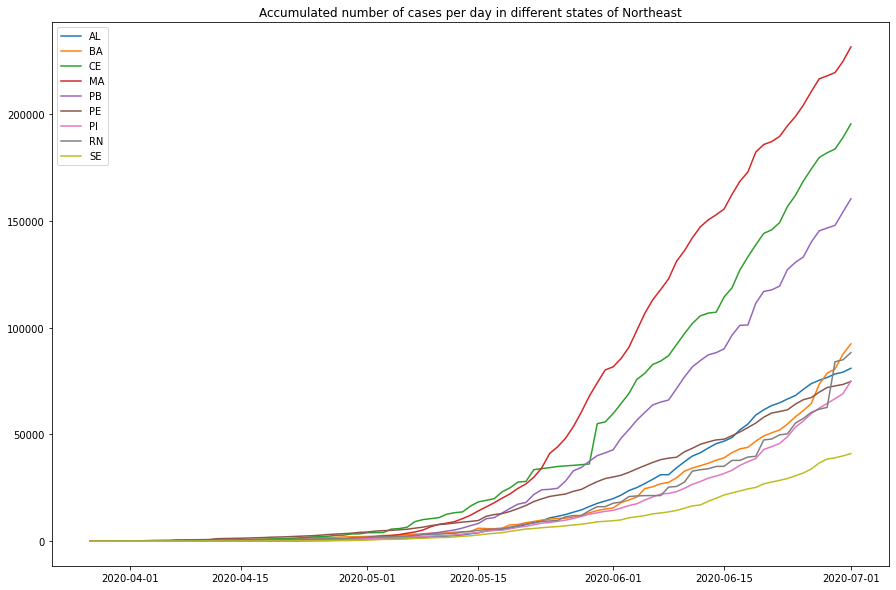

In [63]:
states_numbers_plot('Northeast', accumulated_cases['Northeast'], 'cases')

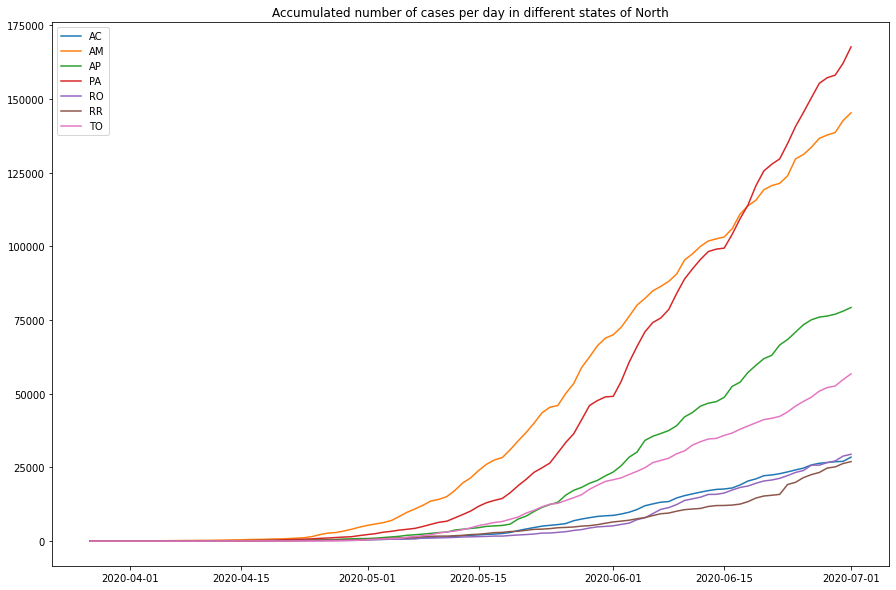

In [59]:
states_numbers_plot('North', accumulated_cases['North'], 'cases')

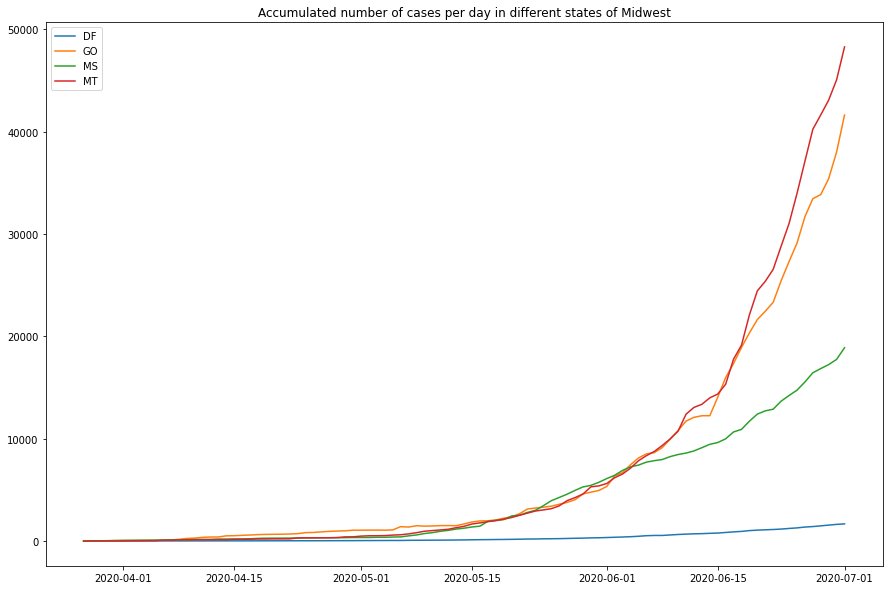

In [60]:
states_numbers_plot('Midwest', accumulated_cases['Midwest'], 'cases')

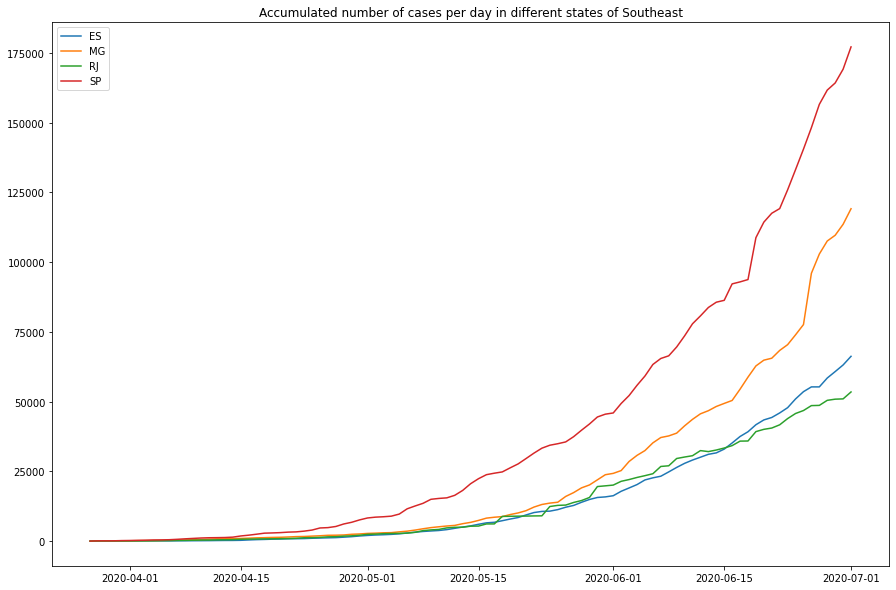

In [61]:
states_numbers_plot('Southeast', accumulated_cases['Southeast'], 'cases')

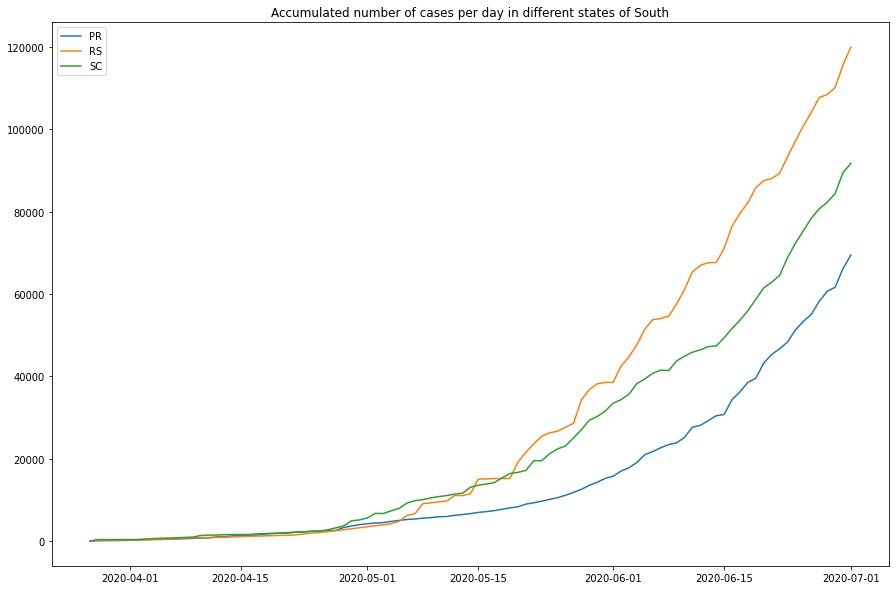

In [ ]:
states_numbers_plot('South', accumulated_cases['South'], 'cases')

# Section 3: Clustering

Let's use unsupervised learning for grouping different cities in Brazil according to their similarities in their numbers of Covid-19. The algorithm to be used is K-means clustering, and I choose not to re-scale the data so that the algorithm considers more recent days as more important, as the numbers are greater.

Individual clustering by regions:

In [64]:
# Clustering by accumulated number of cases:

from sklearn.cluster import KMeans
northeast_kmeans = KMeans(n_clusters = 3, random_state = 0)
northeast_kmeans.fit(accumulated_cases['Northeast'].fillna(0))

north_kmeans = KMeans(n_clusters = 3, random_state = 0)
north_kmeans.fit(accumulated_cases['North'].fillna(0))

midwest_kmeans = KMeans(n_clusters = 3, random_state = 0)
midwest_kmeans.fit(accumulated_cases['Midwest'].fillna(0))

southeast_kmeans = KMeans(n_clusters = 3, random_state = 0)
southeast_kmeans.fit(accumulated_cases['Southeast'].fillna(0))

south_kmeans = KMeans(n_clusters = 3, random_state = 0)
south_kmeans.fit(accumulated_cases['South'].fillna(0))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [65]:
#  Clustering by accumulated number of deaths:

northeastdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
northeastdths_kmeans.fit(accumulated_deaths['Northeast'].fillna(0))

northdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
northdths_kmeans.fit(accumulated_deaths['North'].fillna(0))

midwestdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
midwestdths_kmeans.fit(accumulated_deaths['Midwest'].fillna(0))

southeastdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
southeastdths_kmeans.fit(accumulated_deaths['Southeast'].fillna(0))

southdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
southdths_kmeans.fit(accumulated_deaths['South'].fillna(0))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

For clustering cities with re-scaled data, uncomment and run the next two cells:

In [66]:
# # This cell re-scales data of accumulated cases and trains a K-means clustering model for it

# from sklearn.preprocessing import StandardScaler

# scaler_northeast = StandardScaler()
# scaler_north = StandardScaler()
# scaler_midwest = StandardScaler()
# scaler_southeast = StandardScaler()
# scaler_south = StandardScaler()

# scaled_northeast = scaler_northeast.fit_transform(accumulated_cases['Northeast'].fillna(0))
# scaled_northeast = pd.DataFrame(data = scaled_northeast,
#                                    index = accumulated_cases['Northeast'].index,
#                                    columns = accumulated_cases['Northeast'].columns)

# scaled_north = scaler_north.fit_transform(accumulated_cases['North'].fillna(0))
# scaled_north = pd.DataFrame(data = scaled_north,
#                                    index = accumulated_cases['North'].index,
#                                    columns = accumulated_cases['North'].columns)

# scaled_midwest = scaler_midwest.fit_transform(accumulated_cases['Midwest'].fillna(0))
# scaled_midwest = pd.DataFrame(data = scaled_midwest,
#                                    index = accumulated_cases['Midwest'].index,
#                                    columns = accumulated_cases['Midwest'].columns)

# scaled_southeast = scaler_southeast.fit_transform(accumulated_cases['Southeast'].fillna(0))
# scaled_southeast =  pd.DataFrame(data = scaled_southeast,
#                                    index = accumulated_cases['Southeast'].index,
#                                    columns = accumulated_cases['Southeast'].columns)

# scaled_south = scaler_south.fit_transform(accumulated_cases['South'].fillna(0))
# scaled_south = pd.DataFrame(data = scaled_south,
#                                    index = accumulated_cases['South'].index,
#                                    columns = accumulated_cases['South'].columns)

# from sklearn.cluster import KMeans
# northeast_kmeans = KMeans(n_clusters = 3, random_state=0)
# northeast_kmeans.fit(scaled_northeast)

# north_kmeans = KMeans(n_clusters = 3, random_state=0)
# north_kmeans.fit(scaled_north)

# midwest_kmeans = KMeans(n_clusters = 3, random_state=0)
# midwest_kmeans.fit(scaled_midwest)

# southeast_kmeans = KMeans(n_clusters = 3, random_state=0)
# southeast_kmeans.fit(scaled_southeast)

# south_kmeans = KMeans(n_clusters = 3, random_state=0)
# south_kmeans.fit(scaled_south)

In [67]:
# scaler_northeastdths = StandardScaler()
# scaler_northdths = StandardScaler()
# scaler_midwestdths = StandardScaler()
# scaler_southeastdths = StandardScaler()
# scaler_southdths = StandardScaler()

# scaled_northeastdths = scaler_northeastdths.fit_transform(accumulated_deaths['Northeast'].fillna(0))
# scaled_northeastdths = pd.DataFrame(data = scaled_northeastdths,
#                                    index = accumulated_deaths['Northeast'].index,
#                                    columns = accumulated_deaths['Northeast'].columns)

# scaled_northdths = scaler_northdths.fit_transform(accumulated_deaths['North'].fillna(0))
# scaled_northdths = pd.DataFrame(data = scaled_northdths,
#                                    index = accumulated_deaths['North'].index,
#                                    columns = accumulated_deaths[North'].columns)

# scaled_midwestdths = scaler_midwestdths.fit_transform(accumulated_deaths['Midwest'].fillna(0))
# scaled_midwestdths = pd.DataFrame(data = scaled_midwestdths,
#                                    index = accumulated_deaths['Midwest'].index,
#                                    columns = accumulated_deaths['Midwest'].columns)

# scaled_southeastdths = scaler_southeastdths.fit_transform(accumulated_deaths['Southeast'].fillna(0))
# scaled_southeastdths =  pd.DataFrame(data = scaled_southeastdths,
#                                    index = accumulated_deaths['Southeast'].index,
#                                    columns = accumulated_deaths['Southeast'].columns)

# scaled_southdths = scaler_southdths.fit_transform(accumulated_deaths['South'].fillna(0))
# scaled_southdths = pd.DataFrame(data = scaled_southdths,
#                                    index = accumulated_deaths['South'].index,
#                                    columns = accumulated_deaths['South'].columns)

# northeastdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
# northeastdths_kmeans.fit(scaled_northeastdths)

# northdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
# northdths_kmeans.fit(scaled_northdths)

# midwestdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
# midwestdths_kmeans.fit(scaled_midwestdths)

# southeastdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
# southeastdths_kmeans.fit(scaled_southeastdths)

# southdths_kmeans = KMeans(n_clusters = 3, random_state = 0)
# southdths_kmeans.fit(scaled_southdths)

# Section 4: Maps for accumulated cases

For constructing the maps, we find the geographical coordinates of each city in the country for each region.

## North:

Using Foursquare API for getting coordinates of each city

In [72]:
from geopy.geocoders import Nominatim

north_cities = list(accumulated_cases['North'].index)
north_latitudes = []
north_longitudes = []

for city in north_cities:
    geolocator = Nominatim(user_agent="foursquare_agent")
    address = city
    location = geolocator.geocode(address + ', Brasil')
    latitude = location.latitude
    longitude = location.longitude
    north_latitudes.extend([latitude])
    north_longitudes.extend([longitude])

In [73]:
# Adding Latitude and Longitude to DataFrame
# accumulated_cases['North'].drop(labels=['Latitude', 'Longitude', 'Cluster'],axis = 1 ,  inplace = True)
accumulated_cases['North']['Latitude'] = pd.Series(north_latitudes, index = accumulated_cases['North'].index)
accumulated_cases['North']['Longitude'] = pd.Series(north_longitudes, index = accumulated_cases['North'].index)
accumulated_cases['North']['Cluster'] = pd.Series(north_kmeans.labels_, index = accumulated_cases['North'].index)
cols = accumulated_cases['North'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_cases['North'] = accumulated_cases['North'][new_order]

In [94]:
# # If above cell does not work or takes too long, uncomment this cell for obtaining the dataframe
# accumulated_cases['North'] = pd.read_csv('https://raw.githubusercontent.com/marcellongvb/datasciencecapstone/master/States%20dataframes/accumulated_deaths_north.csv, index_col = 'Unnamed: 0')

In [95]:
# # Uncomment this cell if you chose to use K-means clustering after re-scaling the numbers
# accumulated_cases['North']['Cluster'] = pd.Series(north_kmeans.labels_, index = accumulated_cases['North'].index)

Verifying the gravity of number of cases for each cluster:

Text(0, 0.5, '')

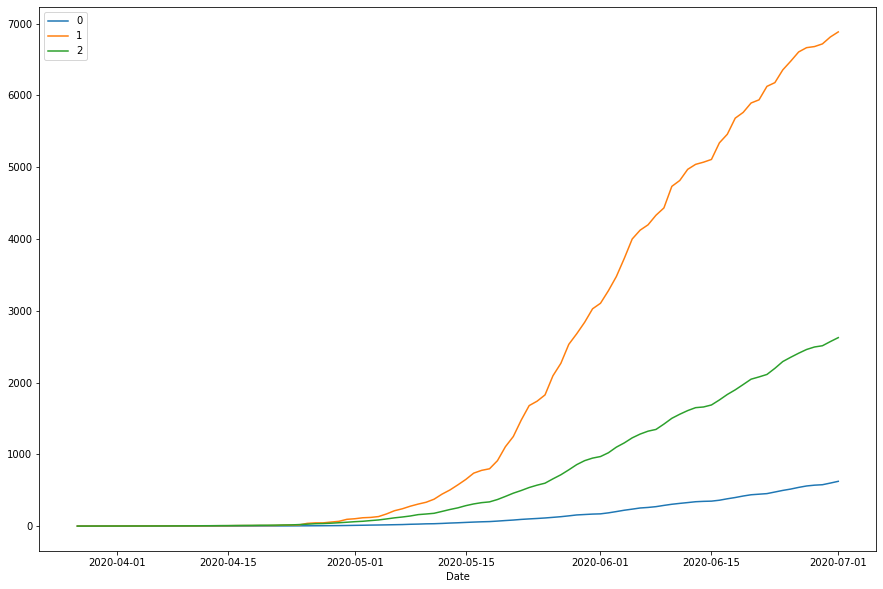

In [84]:
clusters_numbers = accumulated_cases['North'].groupby('Cluster').mean().drop(['Latitude', 'Longitude'], axis=1)

# Converting names of columns from strings to datetime format
datetimetrans = {}
for i in range(len(clusters_numbers.columns)):
    datetimetrans[clusters_numbers.columns[i]] = pd.to_datetime(clusters_numbers.columns[i])
clusters_numbers.rename(columns = datetimetrans, inplace=True)


plt.figure(figsize=(15,10))
ax = sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[0], label = clusters_numbers.index[0])
sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[1], label = clusters_numbers.index[1])
sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[2], label = clusters_numbers.index[2])
ax.set_ylabel('')

- Cluster 0: Lower intensity
- Cluster 1: Higher intensity
- Cluster 2: Intermediate intensity

In [85]:
# Installing unidecode for removing accents of city names
!pip install unidecode

     |████████████████████████████████| 245kB 2.8MB/s 


In [86]:
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent='foursquare_agent')
region_loc =  'Norte Brasil'
loc = geolocator.geocode(region_loc)

import folium

north_map = folium.Map(location=[loc.latitude, loc.longitude], zoom_start=4, tiles = 'Stamen Terrain')

clustercolor = {}
clustercolor[0] = 'lightsalmon'
clustercolor[2] = 'red'
clustercolor[1] = 'maroon'
import unidecode

# instantiate a feature group for the cities in the dataframe
cities_map = folium.map.FeatureGroup()

# loop through the cities and add each to the cities feature group
for lat, lng, clstr, city_name in zip(accumulated_cases['North']['Latitude'],
                                      accumulated_cases['North']['Longitude'],
                                      accumulated_cases['North']['Cluster'],
                                      accumulated_cases['North'].index):
    cities_map.add_child(
    folium.vector_layers.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color= clustercolor[clstr],
            fill=True,
            fill_color= clustercolor[clstr],
            fill_opacity=0.8,
            popup = unidecode.unidecode(city_name)
        )
    )

# add cities to map
north_map.add_child(cities_map)

The city of Capanema, PA, is out of the North region. This is a problem with the database, also found in the following link: https://www.latlong.net/place/capanema-par-brazil-13169.html
The correct coordinates are 1.2056° S, 47.1782° W, according to google maps. Let's correct this data.

In [87]:
accumulated_cases['North'].loc['Capanema, PA',['Latitude', 'Longitude']] = [-1.2056, -47.1782]

In [88]:
accumulated_cases['North'].to_csv('accumulated_cases_north.csv')

We already saw how to deal with cities plotted outside its corresponding with the example of the city of Capanema, PA. I do not do the same for other cities.

In [89]:
# Constructing map again
north_map = folium.Map(location=[loc.latitude, loc.longitude], zoom_start=5, tiles = 'Stamen Terrain')

# instantiate a feature group for the cities in the dataframe
cities_map = folium.map.FeatureGroup()

# loop through the cities and add each to the cities feature group
for lat, lng, clstr, city_name in zip(accumulated_cases['North']['Latitude'],
                                      accumulated_cases['North']['Longitude'],
                                      accumulated_cases['North']['Cluster'],
                                      accumulated_cases['North'].index):
    cities_map.add_child(
    folium.vector_layers.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color= clustercolor[clstr],
            fill=True,
            fill_color= clustercolor[clstr],
            fill_opacity=0.8,
            popup = unidecode.unidecode(city_name)
        )
    )
north_map.add_child(cities_map)

Creating functions for doing the same as done for northeast:

In [90]:
# Defining function for searching latitudes and longitudes and including it, together with cluster labels, to the dataframe. 
#  Input:
#  numbers_df - Dataframe with numbers per date per city;
#  clusterlabels - region_kmeans.labels_ (list of cluster labels)

def latlongclst_add(numbers_df, clusterlabels):
    from  geopy.geocoders import Nominatim
    cities = numbers_df.index
    runs = int(len(cities)/200)
    integer = len(cities) == int(len(cities)/200)*200

    latitudes = []
    longitudes = []
    geolocator = Nominatim(user_agent="foursquare_agent")
    for i in range(runs):
        for j in range(200):            
            address = cities[200*i+j]
            # Sometimes the geolocator returns an error. For ignoring the times when it happens, I use the try command and add zeros to 
            # entrances where an error happens
            try:
                location = geolocator.geocode(address + ', Brasil')                           
                latitude = location.latitude
                longitude = location.longitude
                latitudes.extend([latitude])
                longitudes.extend([longitude])
            except:  
                latitudes.extend([0])
                longitudes.extend([0])
    if ~integer:
        rest = len(cities) - int(len(cities)/200)*200
        for i in range(rest):
            address = cities[200*runs + i]
            try:
                location = geolocator.geocode(address + ', Brasil')
                latitude = location.latitude
                longitude = location.longitude
                latitudes.extend([latitude])
                longitudes.extend([longitude])
            except:
                latitudes.extend([0])
                longitudes.extend([0])

    # numbers_df.drop(labels=['Latitude', 'Longitude', 'Cluster'],axis = 1 ,  inplace = True)
    numbers_df['Latitude'] = pd.Series(latitudes, index = numbers_df.index)
    numbers_df['Longitude'] = pd.Series(longitudes, index = numbers_df.index)
    numbers_df['Cluster'] = pd.Series(clusterlabels, index = numbers_df.index)
    cols = numbers_df.columns.to_list()
    new_order = cols[-3:] + cols[:-3]
    numbers_df = numbers_df[new_order]
    return numbers_df

In [92]:
# Defining function for plotting mean intensities of clusters

def clusters_intensity(numbers_df):
    clusters_numbers = numbers_df.groupby('Cluster').mean().drop(['Latitude', 'Longitude'], axis=1)

    # Converting names of columns from strings to datetime format
    datetimetrans = {}
    for i in range(len(clusters_numbers.columns)):
        datetimetrans[clusters_numbers.columns[i]] = pd.to_datetime(clusters_numbers.columns[i])
    clusters_numbers.rename(columns = datetimetrans, inplace=True)

    # Plotting graphic
    plt.figure(figsize=(15,10))
    ax = sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[0], label = clusters_numbers.index[0])
    sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[1], label = clusters_numbers.index[1])
    sns.lineplot(x = clusters_numbers.columns, y = clusters_numbers.iloc[2], label = clusters_numbers.index[2])
    ax.set_ylabel('')


In [121]:
# Defining function for map plotting of clusters

def covid_intensity_clusters(region, numbers_df, clustercolordict):

    import unidecode
    from  geopy.geocoders import Nominatim
    geolocator = Nominatim(user_agent="foursquare_agent")
    loc = geolocator.geocode(region)

    # Constructing map 
    import folium
    region_map = folium.Map(location=[loc.latitude, loc.longitude], zoom_start=6, tiles = 'Stamen Terrain')
    region_map

    # instantiate a feature group for the cities in the dataframe
    cities_map = folium.map.FeatureGroup()

    # loop through the cities and add each to the cities feature group
    for lat, lng, clstr, city_name in zip(numbers_df['Latitude'],
                                        numbers_df['Longitude'],
                                        numbers_df['Cluster'],
                                        numbers_df.index):
        cities_map.add_child(
        folium.vector_layers.CircleMarker(
                [lat, lng],
                radius=5, # define how big you want the circle markers to be
                color= clustercolordict[clstr],
                fill=True,
                fill_color= clustercolordict[clstr],
                fill_opacity=0.8,
                popup = unidecode.unidecode(city_name)
            )
        )
    region_map.add_child(cities_map)
    return region_map

Now that the functions are ready, let's do the clustering for the other regions:

## Northeast: 

In [ ]:
accumulated_cases['Northeast'] = latlongclst_add(accumulated_cases['Northeast'], northeast_kmeans.labels_)

In [105]:
# # Uncomment this cell if the above code returns error or takes too long
# accumulated_cases['Northeast'] = pd.read_csv('https://github.com/marcellongvb/datasciencecapstone/raw/master/States%20dataframes/accumulated_cases_northeast.csv', index_col = 'Unnamed: 0')
# accumulated_cases['Northeast'].head()

In [97]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_cases['Northeast']['Cluster'] = pd.Series(northeast_kmeans.labels_, index = accumulated_cases['Northeast'].index)

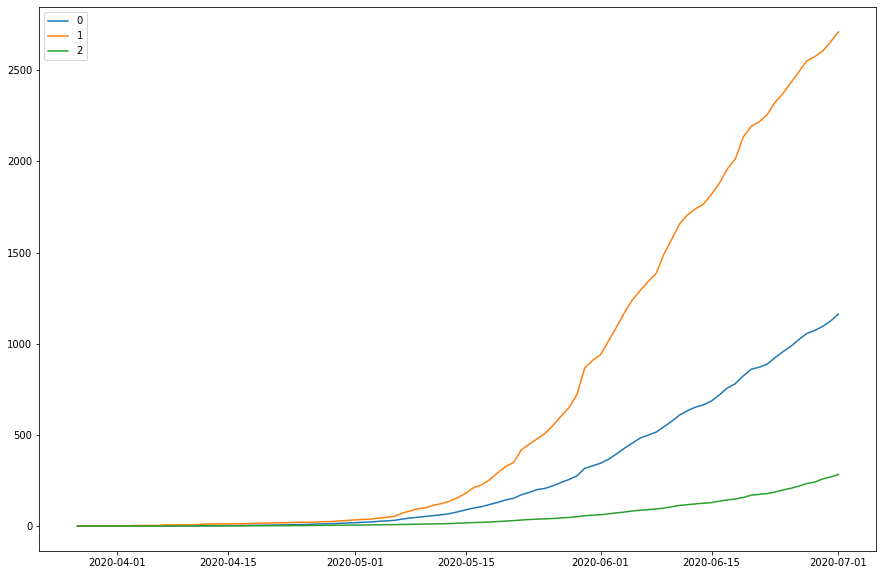

In [98]:
clusters_intensity(accumulated_cases['Northeast'])

In [124]:
clustercolordict = {}
clustercolordict[2] = 'lightsalmon'
clustercolordict[0] = 'red'
clustercolordict[1] = 'maroon'

covid_intensity_clusters('Nordeste, Brasil', accumulated_cases['Northeast'], clustercolordict)

Some cities are marked in wrong locations. This is due to wrong values of coordinates in the database. I already showed how to correct the wrong values by doing so for the city of Capanema, PA, in the North region. I choose not to do the same for other cities from now on.

## Midwest

In [ ]:
accumulated_cases['Midwest'] = latlongclst_add(accumulated_cases['Midwest'], midwest_kmeans.labels_)

In [106]:
# # Uncomment this cell if the above code returns error or takes too long
# accumulated_cases['Midwest'] = pd.read_csv('https://raw.githubusercontent.com/marcellongvb/datasciencecapstone/master/States%20dataframes/accumulated_deaths_midwest.csv', index_col = 'Unnamed: 0')
# accumulated_cases['Midwest'].head()

In [107]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_cases['Midwest']['Cluster'] = pd.Series(midwest_kmeans.labels_, index = accumulated_cases['Midwest'].index)

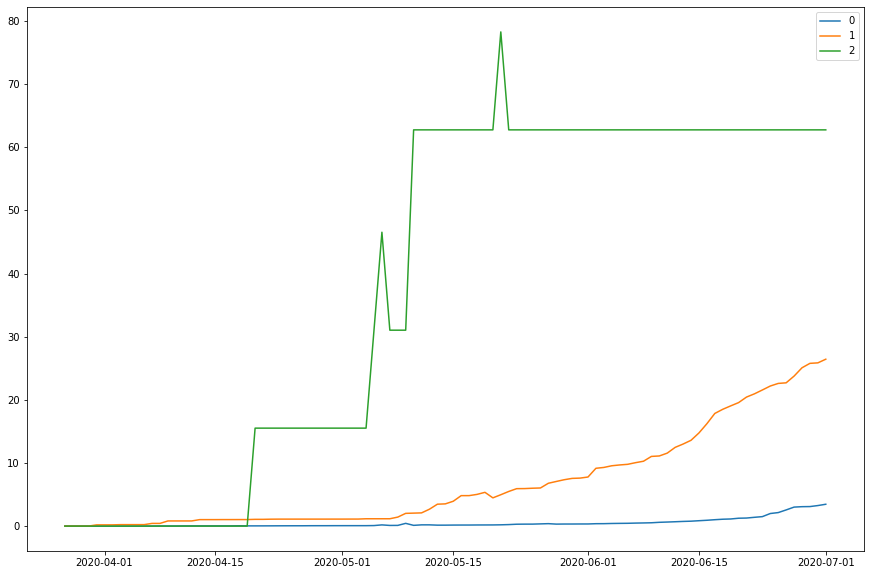

In [108]:
clusters_intensity(accumulated_cases['Midwest'])

In [125]:
clustercolordict = {}
clustercolordict[0] = 'lightsalmon'
clustercolordict[1] = 'red'
clustercolordict[2] = 'maroon'

covid_intensity_clusters('Centro-Oeste, Brasil', accumulated_cases['Midwest'], clustercolordict)

## Southeast

In [ ]:
accumulated_cases['Southeast'] = latlongclst_add(accumulated_cases['Southeast'], southeast_kmeans.labels_)

In [112]:
# # Uncomment this cell if the above code returns error or takes too long
# accumulated_cases['Southeast'] = pd.read_csv('https://github.com/marcellongvb/datasciencecapstone/raw/master/States%20dataframes/accumulated_cases_southeast.csv',
#                                              index_col = 'Unnamed: 0')
# accumulated_cases['Southeast'].head()

In [114]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_cases['Southeast']['Cluster'] = pd.Series(southeast_kmeans.labels_, index = accumulated_cases['Southeast'].index)

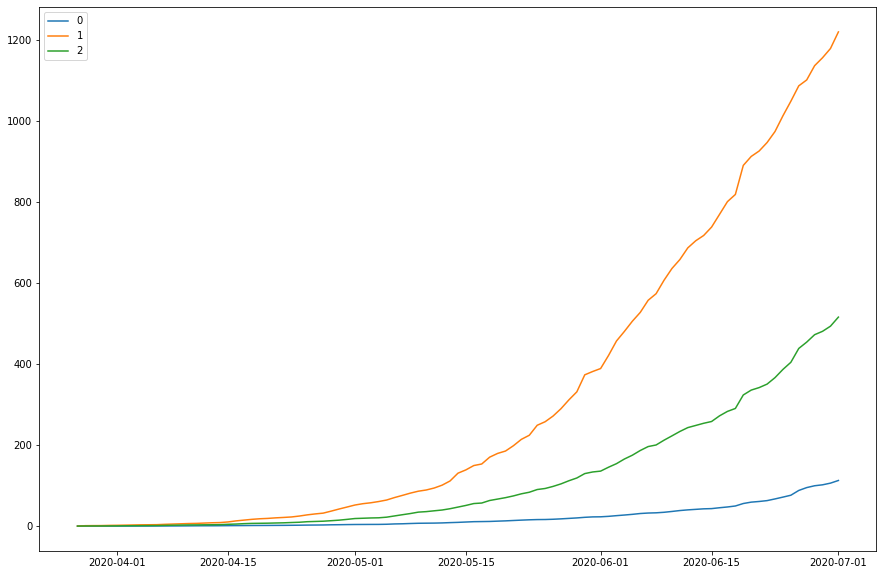

In [115]:
clusters_intensity(accumulated_cases['Southeast'])

In [127]:
clustercolordict = {}
clustercolordict[0] = 'lightsalmon'
clustercolordict[2] = 'red'
clustercolordict[1] = 'maroon'

covid_intensity_clusters('Sudeste, Brasil', accumulated_cases['Southeast'], clustercolordict)

##South:

In [ ]:
accumulated_cases['South'] = latlongclst_add(accumulated_cases['South'], south_kmeans.labels_)

In [118]:
# # Uncomment this cell if the above code returns error or takes too long
# accumulated_cases['South'] = pd.read_csv('https://github.com/marcellongvb/datasciencecapstone/raw/master/States%20dataframes/accumulated_cases_south.csv',
#                                          index_col = 'Unnamed: 0')
# accumulated_cases['South'].head()

In [ ]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_cases['South']['Cluster'] = pd.Series(south_kmeans.labels_, index = accumulated_cases['South'].index)

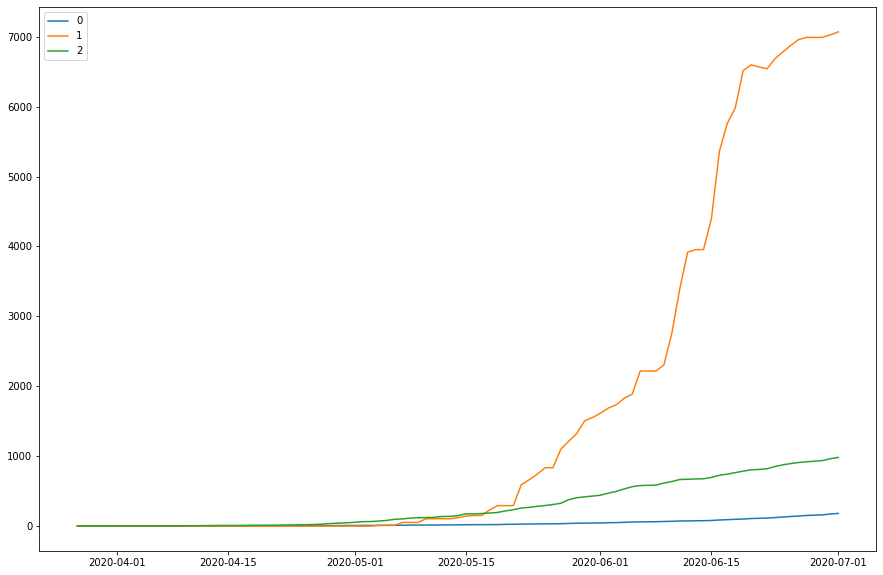

In [119]:
clusters_intensity(accumulated_cases['South'])

In [128]:
clustercolordict = {}
clustercolordict[0] = 'lightsalmon'
clustercolordict[2] = 'red'
clustercolordict[1] = 'maroon'

covid_intensity_clusters('Sul, Brasil', accumulated_cases['South'], clustercolordict)

#Section 5: Maps for accumulated deaths

## North

In [129]:
accumulated_deaths['North']['Latitude'] = accumulated_cases['North']['Latitude']
accumulated_deaths['North']['Longitude'] = accumulated_cases['North']['Longitude']
accumulated_deaths['North']['Cluster'] = pd.Series(northdths_kmeans.labels_, index = accumulated_deaths['North'].index)
cols = accumulated_deaths['North'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_deaths['North'] = accumulated_deaths['North'][new_order]

In [130]:
accumulated_deaths['North'].loc['Oliveira de Fátima, TO', '06/24/2020'] = 0

In [133]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_deaths['North']['Cluster'] = pd.Series(northdths_kmeans.labels_, index = accumulated_deaths['North'].index)

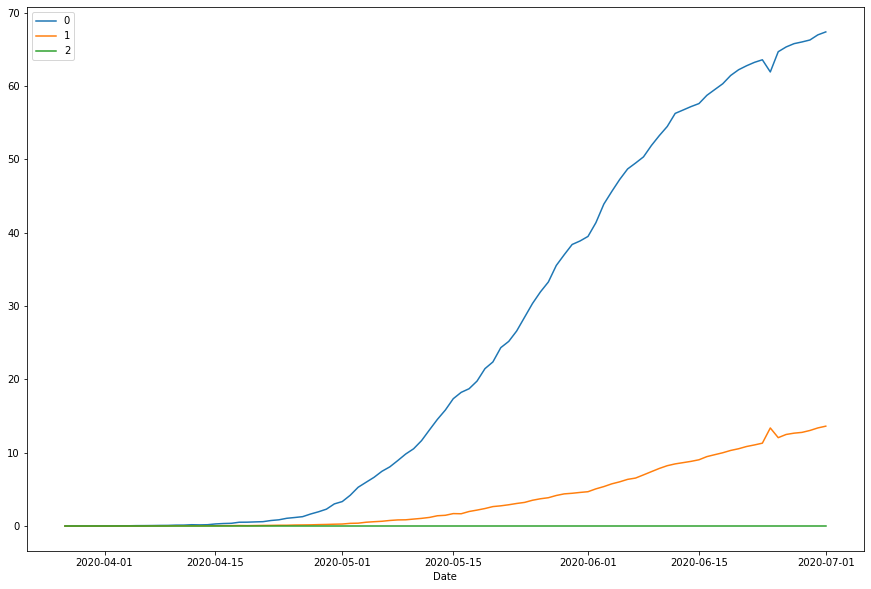

In [134]:
clusters_intensity(accumulated_deaths['North'])

In [135]:
clustercolordict = {}
clustercolordict[2] = 'lightblue'
clustercolordict[1] = 'steelblue'
clustercolordict[0] = 'midnightblue'

covid_intensity_clusters('Norte, Brasil', accumulated_deaths['North'], clustercolordict)

## Northeast

In [138]:
accumulated_deaths['Northeast']['Latitude'] = accumulated_cases['Northeast']['Latitude']
accumulated_deaths['Northeast']['Longitude'] = accumulated_cases['Northeast']['Longitude']
accumulated_deaths['Northeast']['Cluster'] = pd.Series(northeastdths_kmeans.labels_, index = accumulated_deaths['Northeast'].index)
cols = accumulated_deaths['Northeast'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_deaths['Northeast'] = accumulated_deaths['Northeast'][new_order]

In [136]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_deaths['Northeast']['Cluster'] = pd.Series(northeastdths_kmeans.labels_, index = accumulated_deaths['Northeast'].index)

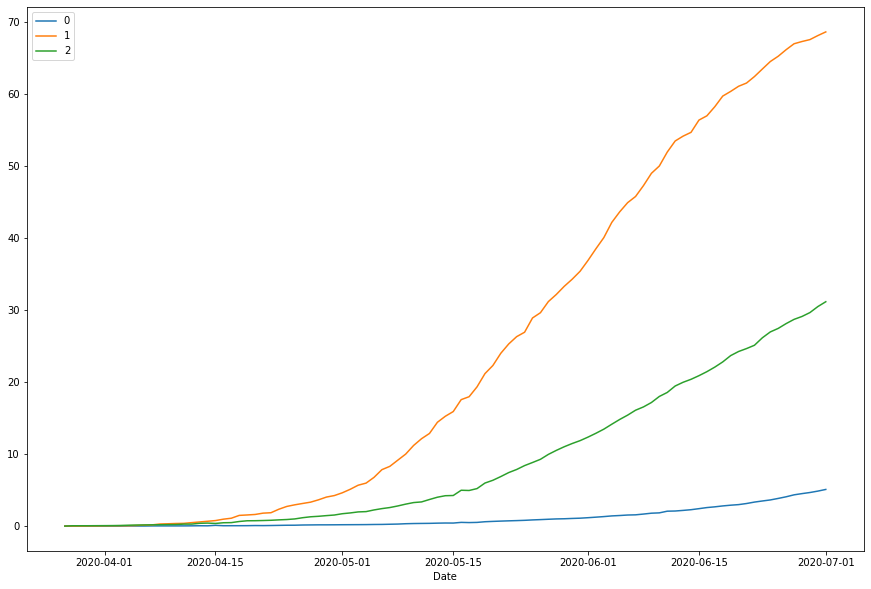

In [139]:
clusters_intensity(accumulated_deaths['Northeast'])

In [142]:
clustercolordict = {}
clustercolordict[0] = 'lightblue'
clustercolordict[2] = 'steelblue'
clustercolordict[1] = 'midnightblue'

covid_intensity_clusters('Nordeste, Brasil', accumulated_deaths['Northeast'], clustercolordict)

## Midwest

In [141]:
accumulated_deaths['Midwest']['Latitude'] = accumulated_cases['Midwest']['Latitude']
accumulated_deaths['Midwest']['Longitude'] = accumulated_cases['Midwest']['Longitude']
accumulated_deaths['Midwest']['Cluster'] = pd.Series(midwestdths_kmeans.labels_, index = accumulated_deaths['Midwest'].index)
cols = accumulated_deaths['Midwest'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_deaths['Midwest'] = accumulated_deaths['Midwest'][new_order]

In [143]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_deaths['Midwest']['Cluster'] = pd.Series(midwestdths_kmeans.labels_, index = accumulated_deaths['Midwest'].index)

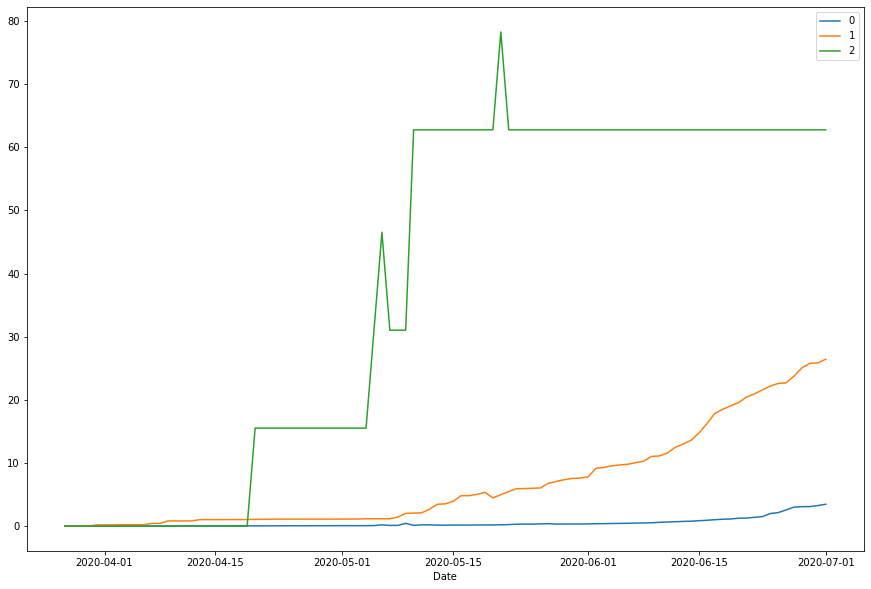

In [144]:
clusters_intensity(accumulated_deaths['Midwest'])

In [145]:
clustercolordict = {}
clustercolordict[0] = 'lightblue'
clustercolordict[1] = 'steelblue'
clustercolordict[2] = 'midnightblue'

covid_intensity_clusters('Centro-oeste, Brasil', accumulated_deaths['Midwest'], clustercolordict)

## Southeast

In [146]:
accumulated_deaths['Southeast']['Latitude'] = accumulated_cases['Southeast']['Latitude']
accumulated_deaths['Southeast']['Longitude'] = accumulated_cases['Southeast']['Longitude']
accumulated_deaths['Southeast']['Cluster'] = pd.Series(southeastdths_kmeans.labels_, index = accumulated_deaths['Southeast'].index)
cols = accumulated_deaths['Southeast'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_deaths['Southeast'] = accumulated_deaths['Southeast'][new_order]

In [147]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_deaths['Southeast']['Cluster'] = pd.Series(southeastdths_kmeans.labels_, index = accumulated_deaths['Southeast'].index)

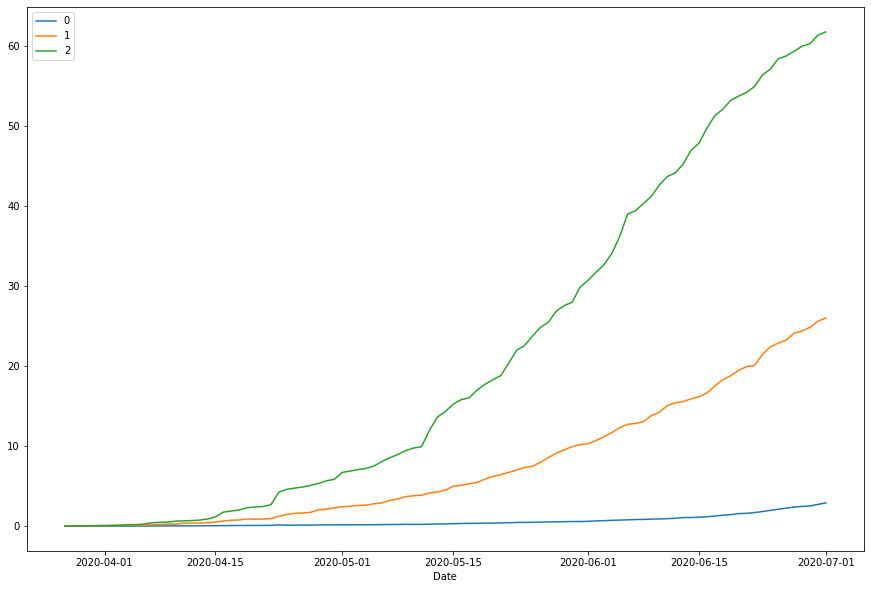

In [148]:
clusters_intensity(accumulated_deaths['Southeast'])

In [149]:
clustercolordict = {}
clustercolordict[0] = 'lightblue'
clustercolordict[1] = 'steelblue'
clustercolordict[2] = 'darkblue'

covid_intensity_clusters('Sudeste, Brasil', accumulated_deaths['Southeast'], clustercolordict)

## South

In [150]:
accumulated_deaths['South']['Latitude'] = accumulated_cases['South']['Latitude']
accumulated_deaths['South']['Longitude'] = accumulated_cases['South']['Longitude']
accumulated_deaths['South']['Cluster'] = pd.Series(southdths_kmeans.labels_, index = accumulated_deaths['South'].index)
cols = accumulated_deaths['South'].columns.to_list()
new_order = cols[-3:] + cols[:-3]
accumulated_deaths['South'] = accumulated_deaths['South'][new_order]

In [151]:
# # Uncomment this cell if you chose to use K-means clustering with re-scaled data
# accumulated_deaths['South']['Cluster'] = pd.Series(southdths_kmeans.labels_, index = accumulated_deaths['South'].index)

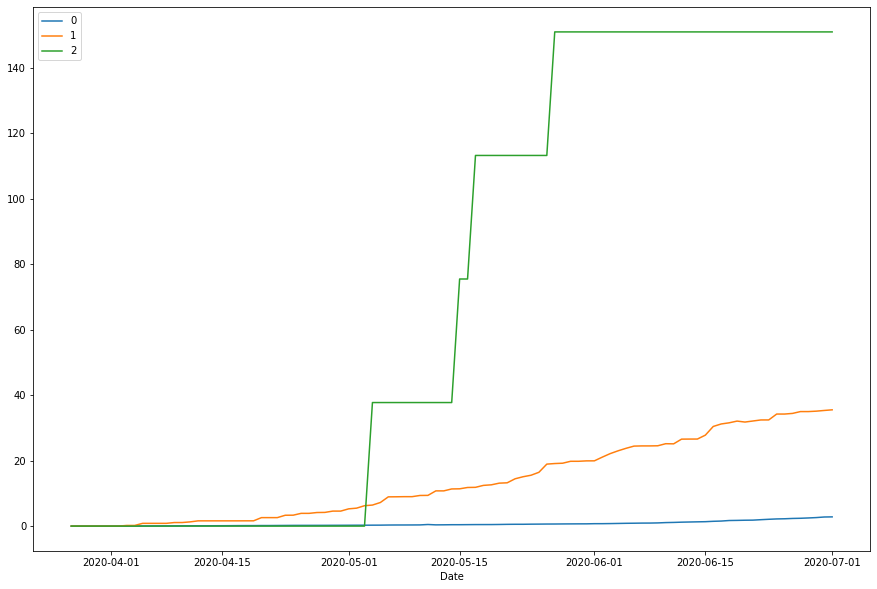

In [152]:
clusters_intensity(accumulated_deaths['South'])

In [153]:
clustercolordict = {}
clustercolordict[0] = 'lightblue'
clustercolordict[1] = 'steelblue'
clustercolordict[2] = 'darkblue'

covid_intensity_clusters('Sul, Brasil', accumulated_deaths['South'], clustercolordict)

For now, I conclude the work. There are still some things I want to do, such as:
- Fix the numbers of accumulated cases and deaths for each city, as there are some cities with some numbers greater than zero for some dates, but with zero or NaN entrance in dates after that. This does not make sense, as the accumulated number must never decrease.
- Use K-means clustering for different periods and plot different maps for each period, to show the spread of the disease.